# TPM Analysis


In [1]:
import sys
sys.path.insert(1, "/Users/smgroves/Documents/pycharm_workspace/mazebox/")
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import dropkick as dk


Bad key "text.kerning_factor" on line 4 in
/Users/smgroves/Documents/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


# Preprocessing

## Read in Files

In [13]:
indir = "../data/loom/SCLC_allograft_looms"

samples = ['YN1','YN2','YN3','YN5','YN6','YN7','YN8','YN9','YN11','YN12','YN13']
[a1,a2,a3,a4,a5,a6,a7,a8,a9,a10,a11] = [mb.pp.read_loom(f"possorted_genome_bam_{sample}", indir) for sample in samples]


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them un

## Filter and concatenate

In [14]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)
genes = sig_matrix.index

Dropkick is a tool to get rid of empty and low-quality droplets based on ambient reads. It should be applied to each sample separately, so we will apply first and then concantenate the data into one AnnData object.

In [22]:
batch_categories = samples
batch_key = 'tumor'

# adata = a1.concatenate([a2,a3,a4,a5,a6,a7,a8,a9,a10,a11], batch_key=batch_key, batch_categories=batch_categories)
adatas = [a1,a2,a3,a4,a5,a6,a7,a8, a9, a10, a11] 


adata = mb.pp.dropkick_recipe(adatas, verbose=False, batch_categories = batch_categories, batch_key = batch_key,
                                                X_final = 'log1p_norm',plot = False,
                                                retain_genes=genes)

Chosen lambda value:
	[0.07450917]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.04966082]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.11578581]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.04436468]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.03524074]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.06741565]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.15436226]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.07805066]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.06232164]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.12423889]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.06461335]
Assigning scores and labels
Done!

Filtered out 12106 genes that are detected 3 counts (spliced).
calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


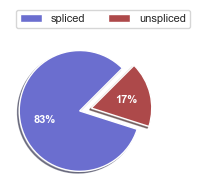

In [23]:
scv.pl.proportions(adata)


In [17]:
# adata = mb.pp.scanpy_recipe(adata, retain_genes=genes, min_cells=1)

Filtered out 8614 genes that are detected in less than 1 cells (spliced).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


## Cell Cycle Regression

In [24]:
adata

AnnData object with n_obs × n_vars = 17514 × 20179
    obs: 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'tumor', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ambient', 'log1p_total_counts_ambient', 'pct_counts_ambient', 'arcsinh_total_counts', 'S_score', 'G2M_score', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-YN1', 'dropkick_coef-YN11', 'dropkick_coef-YN12', 'dropkick_coef-YN13', 'dropkick_coef-YN2', 'dropkick_coef-YN3', 'dropkick_coef-YN5', 'dropkick_coef-YN6', 'dropkick_coef-YN7', 'dropkick_coef-YN8', 'dropkick_coef-YN9', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obs

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


... storing 'phase' as categorical


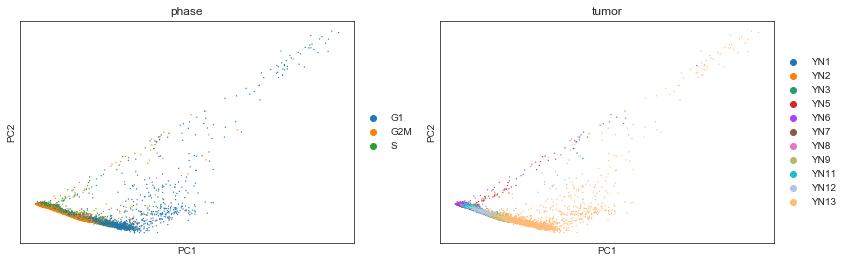

In [25]:
sc.pp.scale(adata)
scv.tl.score_genes_cell_cycle(adata)
sc.tl.pca(adata)
sc.pl.pca_scatter(adata, color=['phase','tumor'])

In [23]:
# sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
# sc.pp.scale(adata)

# Dimensionality Reduction and RNA Velocity

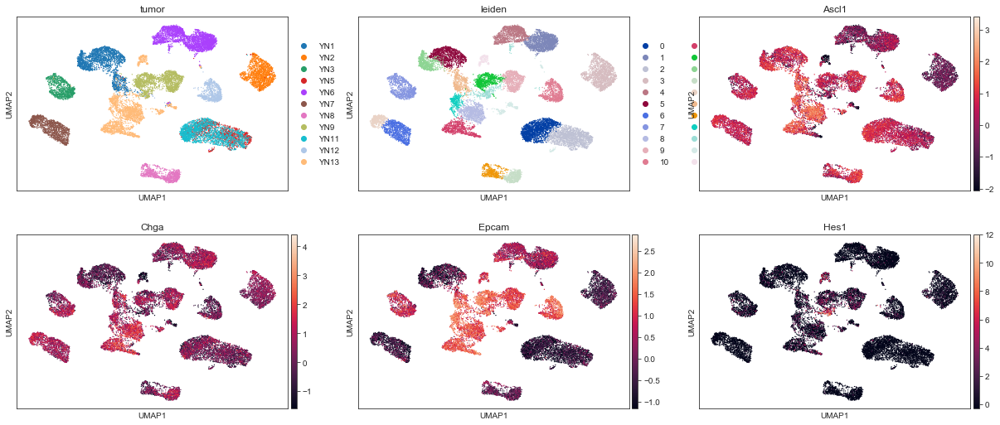

In [26]:
import matplotlib.pyplot as plt
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata, random_state = 1)
sc.pl.umap(adata, color = ['tumor','leiden','Ascl1','Chga','Epcam','Hes1'], ncols = 3)


YN1
YN11
YN12
YN13
YN2
YN3
YN5
YN6
YN7
YN8
YN9
Found 20179 genes among all datasets
[[0.00000000e+00 1.82648402e-02 1.57088123e-01 2.71599468e-01
  4.18648906e-02 4.62459195e-01 6.18458611e-03 4.42435775e-02
  4.80494767e-02 3.80589914e-03 2.82433984e-01]
 [0.00000000e+00 0.00000000e+00 1.27713921e-03 7.53212229e-03
  1.06382979e-02 0.00000000e+00 8.26882477e-01 5.70776256e-04
  0.00000000e+00 1.71232877e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.13665390e-01
  1.40485313e-02 2.33716475e-01 1.02171137e-02 9.83397190e-02
  1.53256705e-02 1.27713921e-03 3.44827586e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  9.30438635e-03 5.87595212e-02 1.72795747e-02 2.61408950e-02
  0.00000000e+00 8.86132034e-03 5.66590126e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 8.70511425e-03 6.58244681e-02 3.80984043e-01
  1.06382979e-02 1.08108108e-03 9.75889782e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.0000000

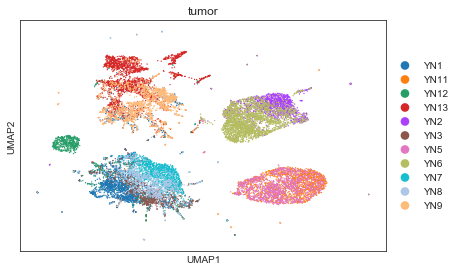

added attributes X_pca_sc and X_umap_sc


In [27]:
mb.pp.scanorama_recipe(adata, groups = 'tumor', correct = True, basis = 'umap')

In [28]:
adata.write_h5ad('../int/allografts/adata01.h5ad')

In [31]:
adata = sc.read_h5ad('../int/allografts/adata01.h5ad')

## Calculating Velocity

In [29]:
scv.pp.moments(adata)
scv.tl.velocity(adata, mode = 'stochastic', groupby = 'tumor')
scv.tl.velocity_graph(adata)


Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:15) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:26) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:44:30) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


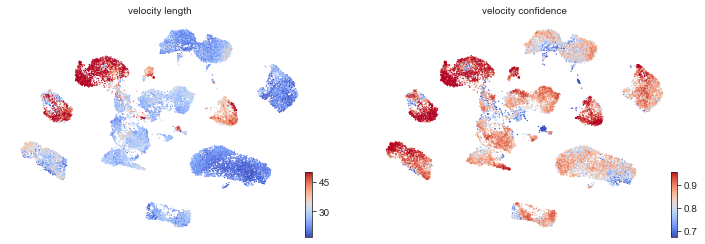

In [30]:
scv.tl.velocity_confidence(adata)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'umap')

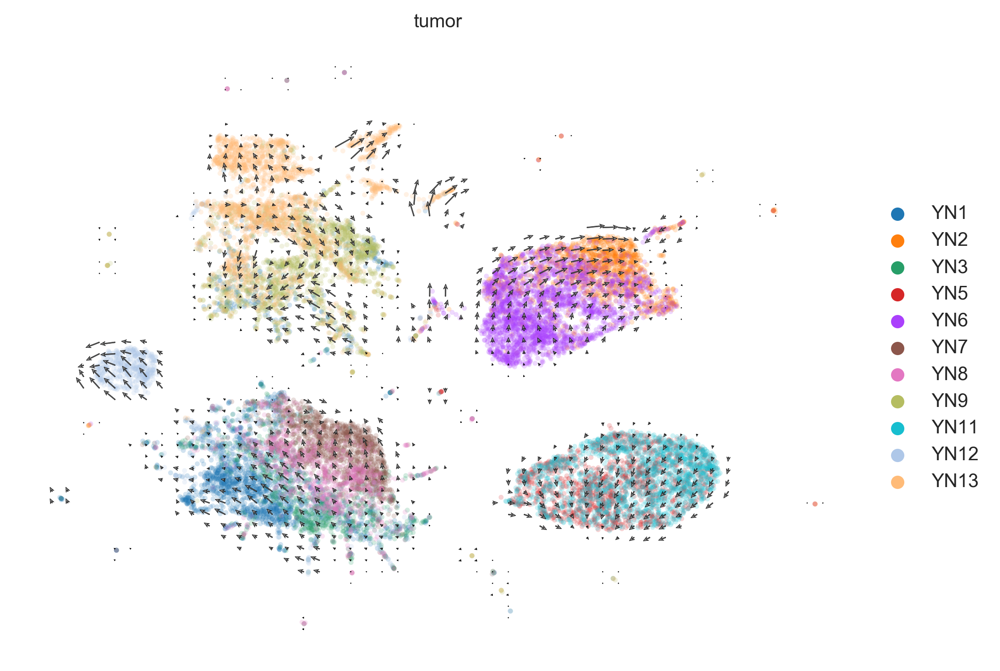

In [40]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap_sc', figsize = (8,6), legend_loc = 'on right',color = 'tumor', dpi = 300)


Let's save the data at this point.

In [32]:
adata.write_h5ad('../int/allografts/adata02.h5ad')

In [25]:
adata = sc.read_h5ad('../int/allografts/adata02.h5ad')

# Pseudotime and plasticity

We would like to see if we can get the same results as Ireland et al. did for their pseudotime analysis. To run Monocle2, we need the R interface `rpy2`. We'll also use the pseudotime inference within scvelo for comparison.

In [33]:
scv.tl.terminal_states(adata, groupby='tumor')

computing terminal states
    identified 1 region of root cells and 1 region of end points  (YN1).
    identified 2 regions of root cells and 1 region of end points  (YN2).
    identified 1 region of root cells and 1 region of end points  (YN3).
    identified 4 regions of root cells and 1 region of end points  (YN5).
    identified 4 regions of root cells and 1 region of end points  (YN6).
    identified 3 regions of root cells and 1 region of end points  (YN7).
    identified 2 regions of root cells and 1 region of end points  (YN8).
    identified 3 regions of root cells and 1 region of end points  (YN9).
    identified 7 regions of root cells and 1 region of end points  (YN11).
    identified 4 regions of root cells and 1 region of end points  (YN12).
    identified 2 regions of root cells and 1 region of end points  (YN13).
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process 

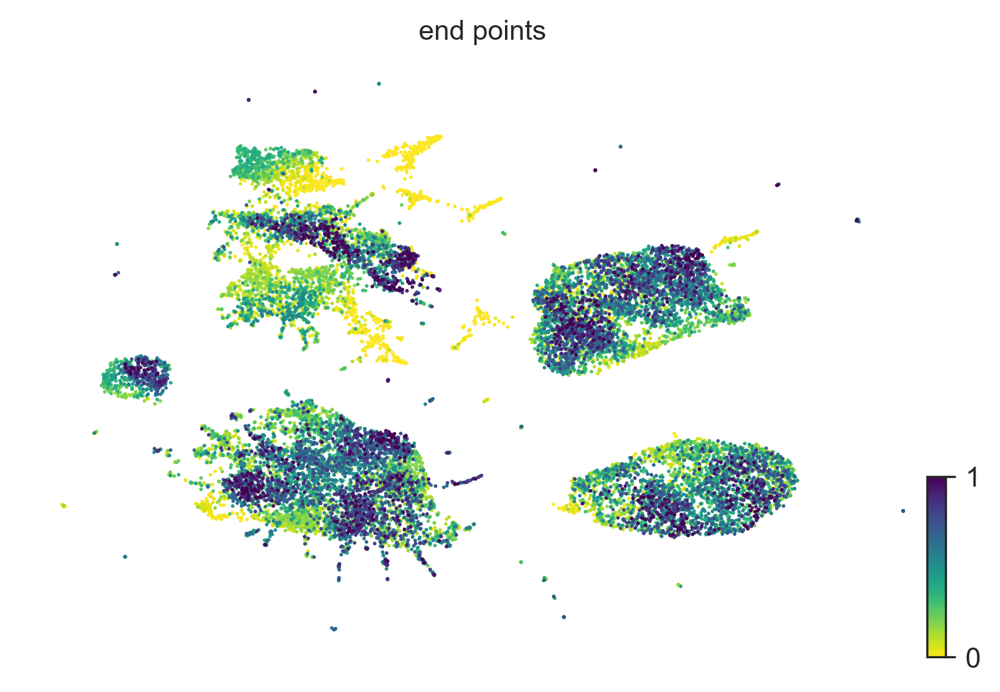

In [42]:
scv.pl.scatter(adata, color="end_points", basis = 'umap_sc', dpi = 300)

### Velocity pseudotime

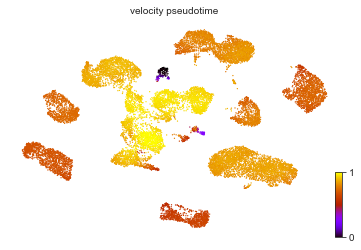

In [35]:
# Velocity pseudotime from scvelo
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot', basis = 'umap')


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:08) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


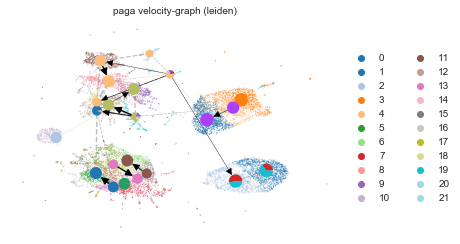

In [11]:
mb.ps.velocity_paga(adata, basis='umap_sc', color = 'tumor')


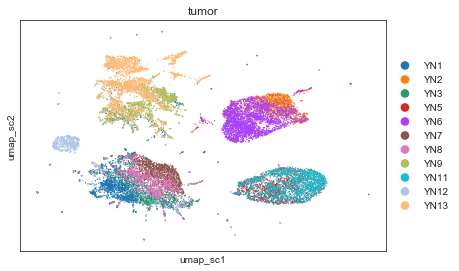

In [44]:
sc.pl.scatter(adata, color = 'tumor', basis = 'umap_sc')


In [45]:
adata.write_h5ad('../int/allografts/adata03.h5ad')


In [2]:
adata = sc.read_h5ad('../int/allografts/adata03.h5ad')


### Calculate plasticity using CTrP

In [3]:
# mb.ps.ctrp_simplified(adata, distance_basis='X_pca', groupby = 'tumor')
mb.ps.ctrp_simplified(adata, distance_basis='X_pca', self_transitions=False, eps=.1, groupby = 'tumor')

(YN1)
Eigenvalues:  [1.0000015]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.01746571 0.00555343 0.00321797 ... 0.00082681 0.00172383 0.00983596]
 [0.01104165 0.00978588 0.01500371 ... 0.00234051 0.00221239 0.00702918]
 [0.01390744 0.00592057 0.00275514 ... 0.00136093 0.00248391 0.0105788 ]
 ...
 [0.01297189 0.01119545 0.00986255 ... 0.00180945 0.00217822 0.0105753 ]
 [0.00870197 0.01073849 0.02261337 ... 0.00134302 0.00102023 0.00671321]
 [0.01564551 0.00420875 0.00256721 ... 0.00124753 0.00666199 0.00714952]]
(YN2)
Eigenvalues:  [1.0000006]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.01613682 0.02893922 0.00089846 ... 0.0129006  0.00029516 0.03688323]
 [0.01212562 0.01772858 0.00139639 ... 0.01671084 0.00066934 0.02220492]
 [0.01742371 0.01376725 0.00060085 ... 0.02257247 0.00019205 0.03664452]
 ...
 [0.01278217 0.02168635 0.00075494 ... 0.01837531 0.00033207 0.02906016]
 [0.00863721 0.02025018 0.00191314 ... 0.01597852 0.00365346 0.02303083]
 [0.01421066 0.01914765 0.00077146 ... 0.01934939 0.00026158 0.03795961]]
(YN3)
Eigenvalues:  [1.]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.02631745 0.02554996 0.0118547  ... 0.01522682 0.02364224 0.00485688]
 [0.01775635 0.03307694 0.01696794 ... 0.02998924 0.02117063 0.00081497]
 [0.0158156  0.03060622 0.01862394 ... 0.02785372 0.02378017 0.00087543]
 ...
 [0.01804391 0.03624033 0.01648465 ... 0.03111337 0.02168254 0.00094369]
 [0.02515946 0.02520147 0.01524736 ... 0.01577373 0.02284028 0.00144258]
 [0.01662131 0.03882969 0.01709435 ... 0.02729476 0.02147532 0.00082449]]
(YN5)
Eigenvalues:  [1.]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.01068574 0.02191999 0.00521991 ... 0.00812933 0.00785645 0.02299491]
 [0.00670456 0.0161568  0.00325427 ... 0.01446708 0.00248598 0.04912749]
 [0.02082718 0.02543504 0.0055493  ... 0.01136002 0.02000616 0.01259435]
 ...
 [0.02520513 0.01281881 0.01273392 ... 0.00539238 0.02431153 0.01715966]
 [0.00680785 0.01656836 0.00260339 ... 0.01480923 0.00244581 0.03585563]
 [0.00657284 0.01618545 0.00260914 ... 0.01432716 0.00224684 0.03744039]]
(YN6)
Eigenvalues:  [1.000001]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.00060023 0.00102106 0.00054347 ... 0.03179998 0.00049971 0.0006116 ]
 [0.0065133  0.0160701  0.00366507 ... 0.00327838 0.00661674 0.00547113]
 [0.00063113 0.00104527 0.00057946 ... 0.0309515  0.00050435 0.0006544 ]
 ...
 [0.0089046  0.0186241  0.00590884 ... 0.00150951 0.00570611 0.0072676 ]
 [0.00300007 0.00416817 0.00291921 ... 0.02215099 0.00186589 0.00331044]
 [0.01256889 0.02244609 0.0083412  ... 0.00043619 0.00610634 0.01854001]]
(YN7)
Eigenvalues:  [1.0000012]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.00716822 0.03209129 0.01016213 ... 0.01758091 0.00419426 0.        ]
 [0.00731475 0.03117213 0.01088094 ... 0.01741237 0.00433979 0.        ]
 [0.00649531 0.02350731 0.01158402 ... 0.02034205 0.00451217 0.        ]
 ...
 [0.01604151 0.00852674 0.02205223 ... 0.02353347 0.01532721 0.        ]
 [0.0069399  0.03197907 0.01007405 ... 0.0174733  0.00415073 0.        ]
 [0.00660043 0.03221778 0.00986978 ... 0.02624333 0.00398589 0.        ]]
(YN8)
Eigenvalues:  [0.99999964]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[7.33705859e-03 1.14193994e-03 1.28882495e-02 ... 9.83957452e-11
  2.46012849e-02 1.18989162e-02]
 [1.49075891e-02 5.61133008e-03 2.62309839e-02 ... 1.68824059e-10
  2.12536962e-02 2.08828044e-02]
 [9.57425602e-03 1.85489100e-03 2.49284253e-02 ... 3.72773221e-09
  1.77220835e-02 1.49468897e-02]
 ...
 [1.62855082e-02 1.66177587e-03 2.56948200e-02 ... 1.54721306e-10
  2.37340436e-02 2.17143578e-02]
 [8.48297425e-03 1.60792761e-03 1.54491558e-02 ... 8.70076287e-11
  2.82298919e-02 2.30521732e-02]
 [9.52923551e-03 1.83685428e-03 2.49084018e-02 ... 3.48047476e-09
  1.77595649e-02 1.49563822e-02]]
(YN9)
Eigenvalues:  [0.9999951]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.01218509 0.00892083 0.01214889 ... 0.01061472 0.00315199 0.00941561]
 [0.01488301 0.01408572 0.01296675 ... 0.01089905 0.00151773 0.01194659]
 [0.01213969 0.00863841 0.01314982 ... 0.01188503 0.00318766 0.00956819]
 ...
 [0.01205158 0.01036073 0.01327725 ... 0.01102154 0.00330135 0.00971924]
 [0.01422914 0.00791202 0.01664331 ... 0.01245945 0.00275687 0.00794313]
 [0.01144362 0.00826197 0.01250737 ... 0.01537401 0.00269614 0.01346942]]
(YN11)
Eigenvalues:  [0.99999714]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[7.03634427e-05 2.38056233e-03 5.81642114e-03 ... 1.14254389e-02
  9.49107450e-03 1.14811162e-03]
 [8.02694391e-05 2.27305160e-03 7.33178759e-03 ... 9.63689687e-03
  7.73475506e-03 1.55959136e-03]
 [7.05443211e-05 2.38508198e-03 5.81653281e-03 ... 1.14510670e-02
  9.54149797e-03 1.14708125e-03]
 ...
 [1.36233702e-04 1.10911084e-02 9.57463933e-03 ... 2.60096827e-02
  2.58015527e-02 1.73109718e-03]
 [4.51373148e-05 3.26580775e-03 9.83435203e-03 ... 2.25928442e-02
  9.83839314e-03 2.76265474e-03]
 [7.16162951e-05 2.39398356e-03 5.82194043e-03 ... 1.15016126e-02
  9.53297518e-03 1.15396605e-03]]
(YN12)
Eigenvalues:  [1.0000007]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.03929809 0.03541551 0.03178389 ... 0.04403192 0.01734692 0.        ]
 [0.04987493 0.04556582 0.0262279  ... 0.04208239 0.01155863 0.        ]
 [0.04813591 0.03674959 0.02745895 ... 0.04370328 0.02377939 0.        ]
 ...
 [0.03555555 0.03283966 0.03140081 ... 0.04117939 0.01542223 0.        ]
 [0.04213672 0.03424275 0.03146182 ... 0.04331184 0.01883983 0.        ]
 [0.04366995 0.04475113 0.02205129 ... 0.03710441 0.00660764 0.        ]]
(YN13)
Eigenvalues:  [0.9999932]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.00049489 0.01187148 0.01100639 ... 0.01020414 0.00345385 0.00295932]
 [0.00058764 0.01032316 0.00978087 ... 0.00952004 0.00322771 0.00305574]
 [0.00041119 0.01216979 0.01096801 ... 0.01016273 0.00349568 0.0027294 ]
 ...
 [0.00053326 0.01155198 0.01096097 ... 0.01034809 0.00352145 0.00309046]
 [0.00020225 0.01351928 0.01052567 ... 0.00860621 0.0026632  0.00198647]
 [0.00053585 0.01147224 0.01096948 ... 0.01025437 0.00349234 0.00308577]]


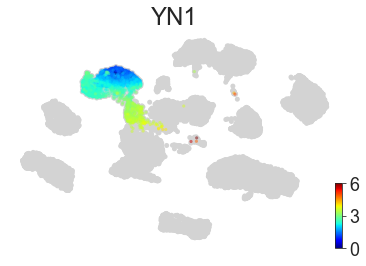

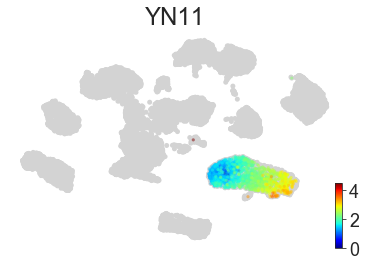

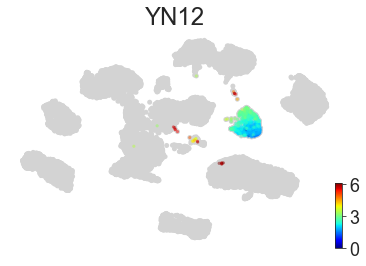

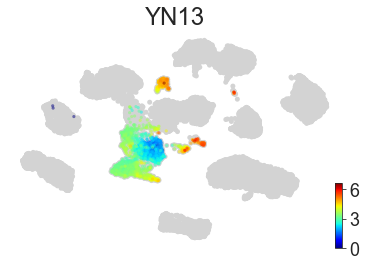

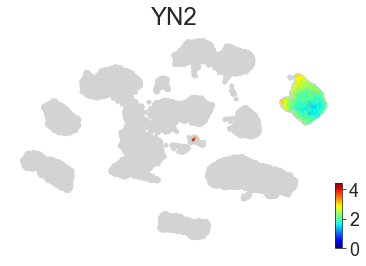

...

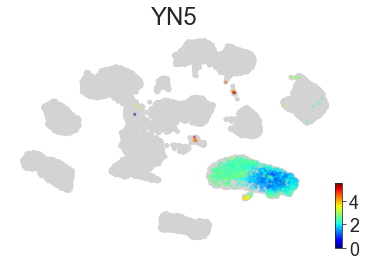

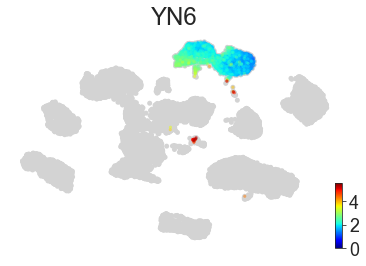

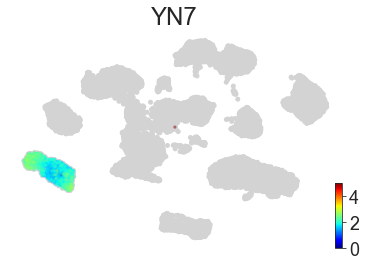

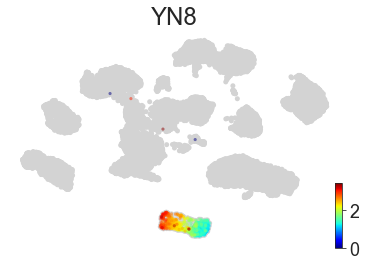

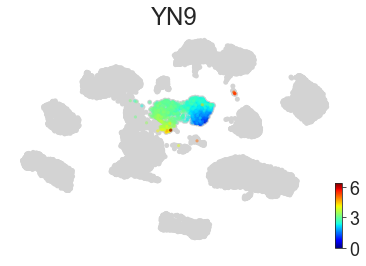

In [4]:
# mb.ps.ctrp(adata, self_transitions=False, adata_dist='X_pca', groupby = 'tumor')

mb.pl.ctrp_groups(adata, groups = 'tumor', basis = 'umap')


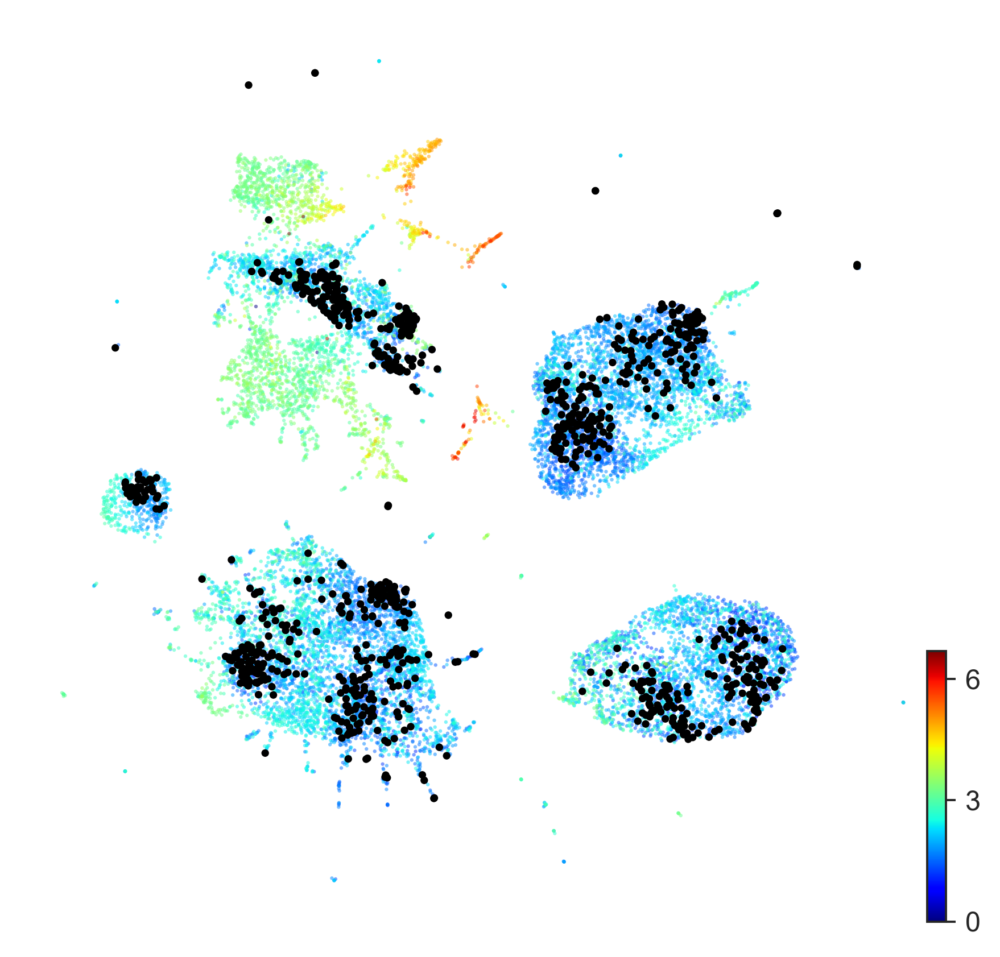

In [5]:
mb.pl.ctrp(adata, basis = 'umap_sc')


In [6]:
adata.write_h5ad('../int/allografts/adata04.h5ad')


In [2]:
adata = sc.read_h5ad('../int/allografts/adata04.h5ad')


In [13]:
therapy_dict = {"Sensitive":['YN4','YN6','YN10','YN12'], 'More resistant':['YN11'], 'Resistant clone' : ['YN2'],
                "Resistant":['YN1','YN3','YN5','YN7','YN8','YN9'], 'TKO':['YN13']}

reverse_dict = {}
for i in therapy_dict.keys():
    for j in therapy_dict[i]:
        reverse_dict[j] = i

adata.obs['response'] = [reverse_dict[i] for i in adata.obs['tumor']]


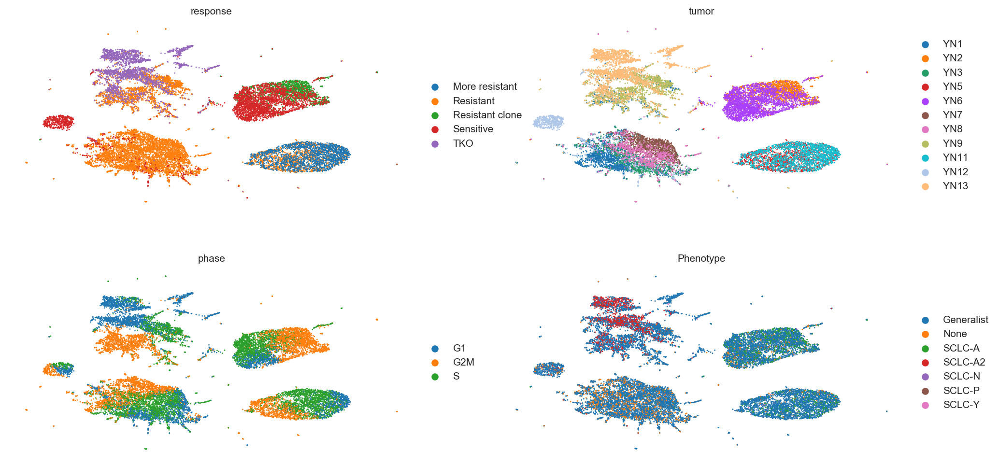

In [42]:
scv.pl.scatter(adata, basis = 'umap_sc', color=['response','tumor','phase','Phenotype'], dpi = 150, legend_loc='right margin', ncols=2)

# Signature Subtyping

In [18]:
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
# adata = sc.read_h5ad('../int/tko/adata04.h5ad')
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)
sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)
ind = []
for i in sig_matrix.index:
    ind.append(i.capitalize())
sig_matrix.index = ind


In [3]:
#  mb.pl.twodimplot_tumor(data=data,veldata= data_vel,adata= adata_small,gene_sig= sig_matrix2, celltype1 = 2, celltype2 = 4,
#                      save = False, dir_prefix = outdir_, meanonly = True,
#                      tumor_clust_name='timepoint')

In [20]:
outdir_ = './out/'

data, sig_matrix1, adata_small, lanorm = mb.ar.transform_tumor_space(adata, sig_matrix, unlog=False, scale=False, type = None)


        # Transform velocity vectors
data_vel, sig_matrix2, adata_small = mb.ar.transform_vel(adata_small, sig_matrix1, scale=False, lanorm=lanorm)

# # Plot tumor data with velocity in cell type space
# for clust in range(4):
#     mb.pl.twodimplot_tumor(data=data,veldata= data_vel,adata= adata_small,gene_sig= sig_matrix2, celltype1 = clust, celltype2 = clust+1,
#                      save = False, dir_prefix = outdir_,
#                      tumor_clust_name='timepoint')
#     mb.pl.twodimplot_tumor(data=data, veldata=data_vel, adata=adata_small, gene_sig=sig_matrix2, celltype1=clust, celltype2=clust + 1,
#                      save=False, dir_prefix=outdir_,
#                      meanonly = True, tumor_clust_name='timepoint')



Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (92, 5)
Tumor data shortened to genes in gene list...
(17513, 92)
Tumor data subsetting complete.


In [21]:
data.index = adata_small.obs_names
data.columns = sig_matrix.columns
for s in data:
    adata_small.obs[f"{s}_Score"] = data[s]
data_vel.index = adata_small.obs_names
data_vel.columns = sig_matrix.columns
for s in data_vel:
    adata_small.obs[f"{s}_Score_t1"] = data_vel[s] + data[s]
    

In [122]:
adata_small.obs['tumor'] = adata_small.obs['tumor'].astype('category')


In [23]:
#filtered phenotype
pheno = []

for i,r in data.iterrows():
    test = r*(r>0)
    if test.max() < .1: pheno.append('None')

    elif test.max()>.5:
# #     if (test/test.sum()).max()>.9:
        pheno.append(data.columns[test.argmax()])
    else: pheno.append('Generalist')
adata_small.obs['Phenotype'] = pheno


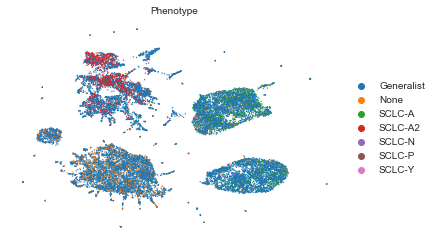

In [25]:
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'Phenotype', legend_loc='right margin')

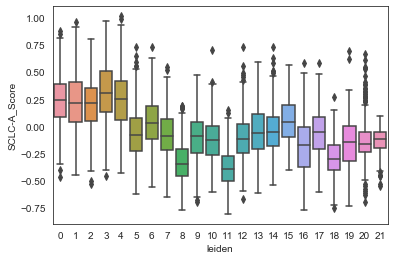

In [26]:
sns.boxplot(data= adata_small.obs, x='leiden', y = 'SCLC-A_Score')

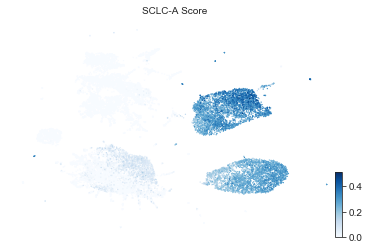

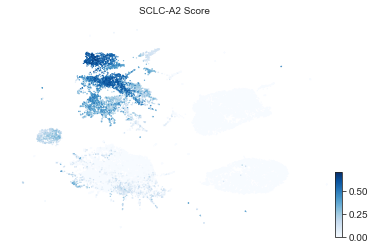

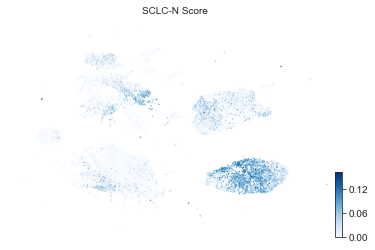

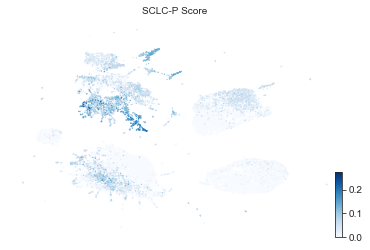

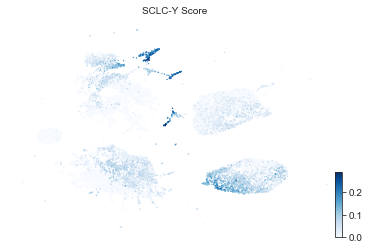

In [28]:
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'SCLC-A_Score', vmin = 0, smooth = True, color_map='Blues')
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'SCLC-A2_Score', vmin = 0, smooth = True, color_map='Blues')
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'SCLC-N_Score', vmin = 0, smooth = True, color_map='Blues')
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'SCLC-P_Score', vmin = 0, smooth = True, color_map='Blues')
scv.pl.scatter(adata_small, basis = 'umap_sc', color = 'SCLC-Y_Score', vmin = 0, smooth = True, color_map='Blues')

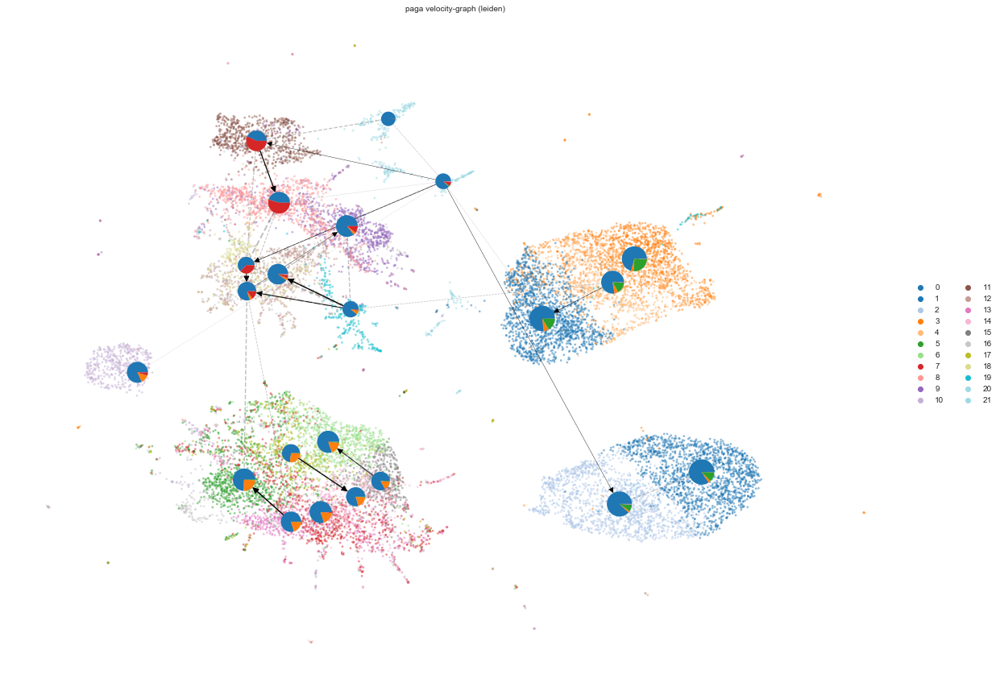

In [29]:
plt.rcParams["figure.figsize"] = (20,15)

scv.pl.paga(adata_small,basis = 'umap_sc', color = 'Phenotype', node_size_scale = 5, size = 30)



Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-P_Score'], dtype='object')


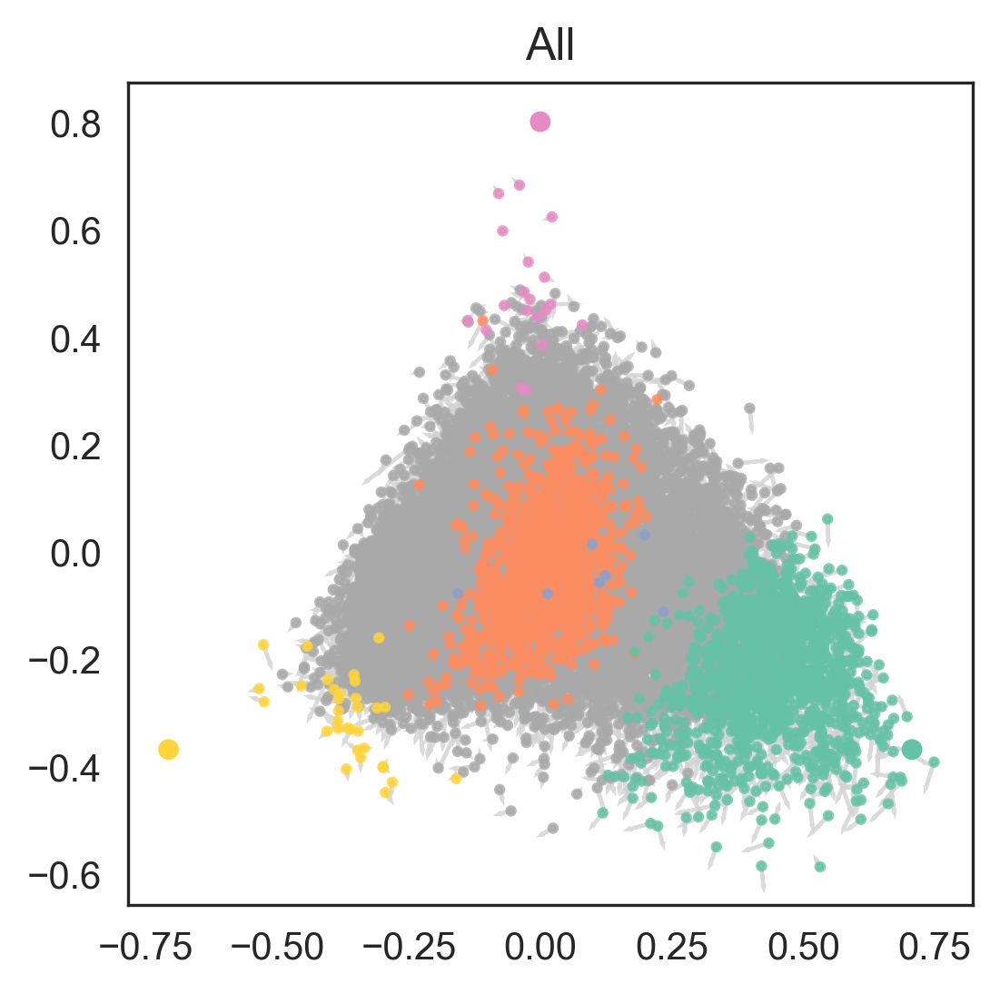

In [30]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='Phenotype',grid = False, mean_only = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(4,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20, arrows = True)



YN1
Index(['SCLC-P_Score', 'SCLC-N_Score', 'SCLC-Y_Score'], dtype='object')


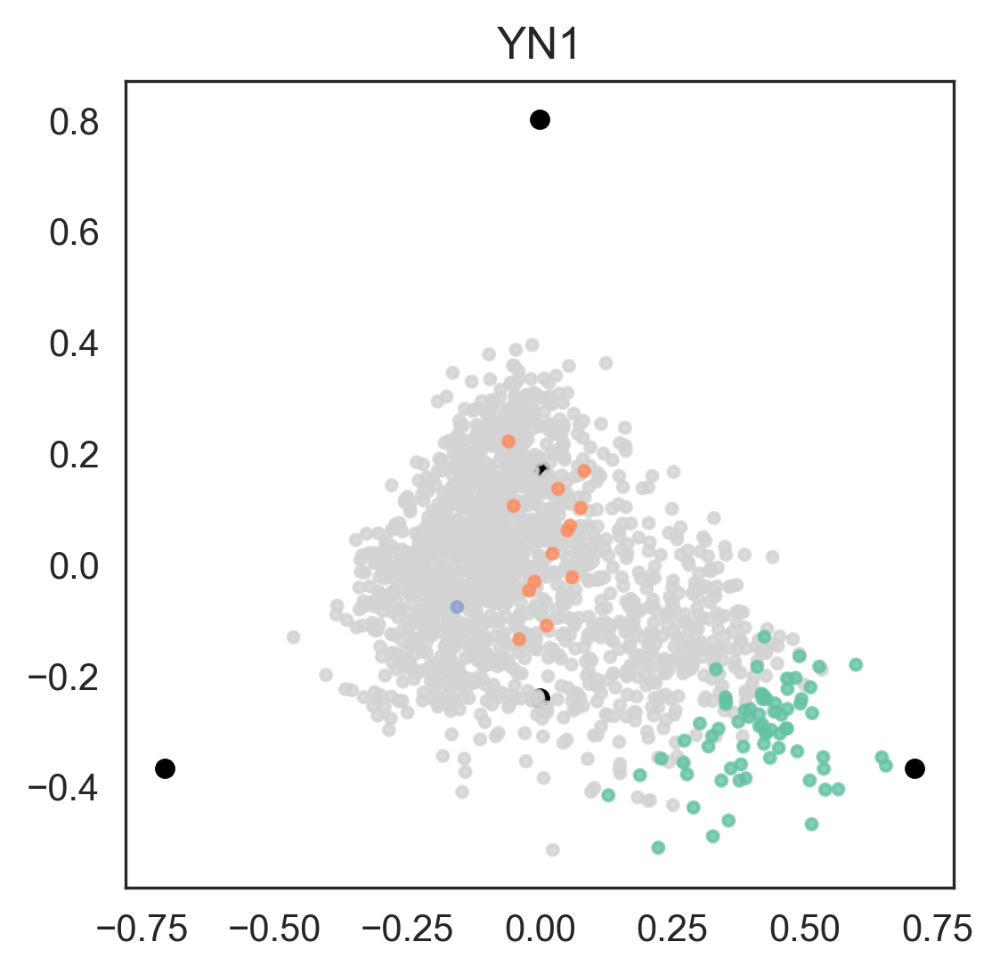

YN2
Index(['SCLC-A_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


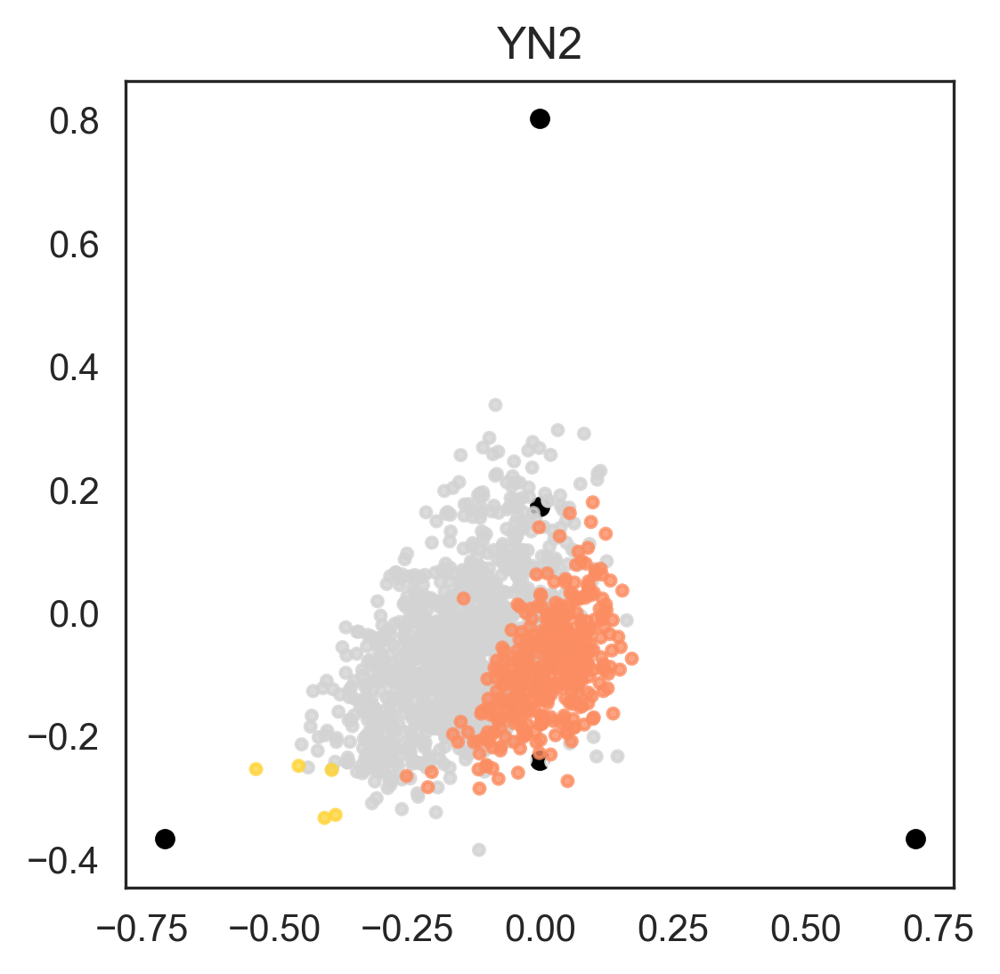

YN3
Index(['SCLC-A2_Score', 'SCLC-P_Score', 'SCLC-Y_Score'], dtype='object')


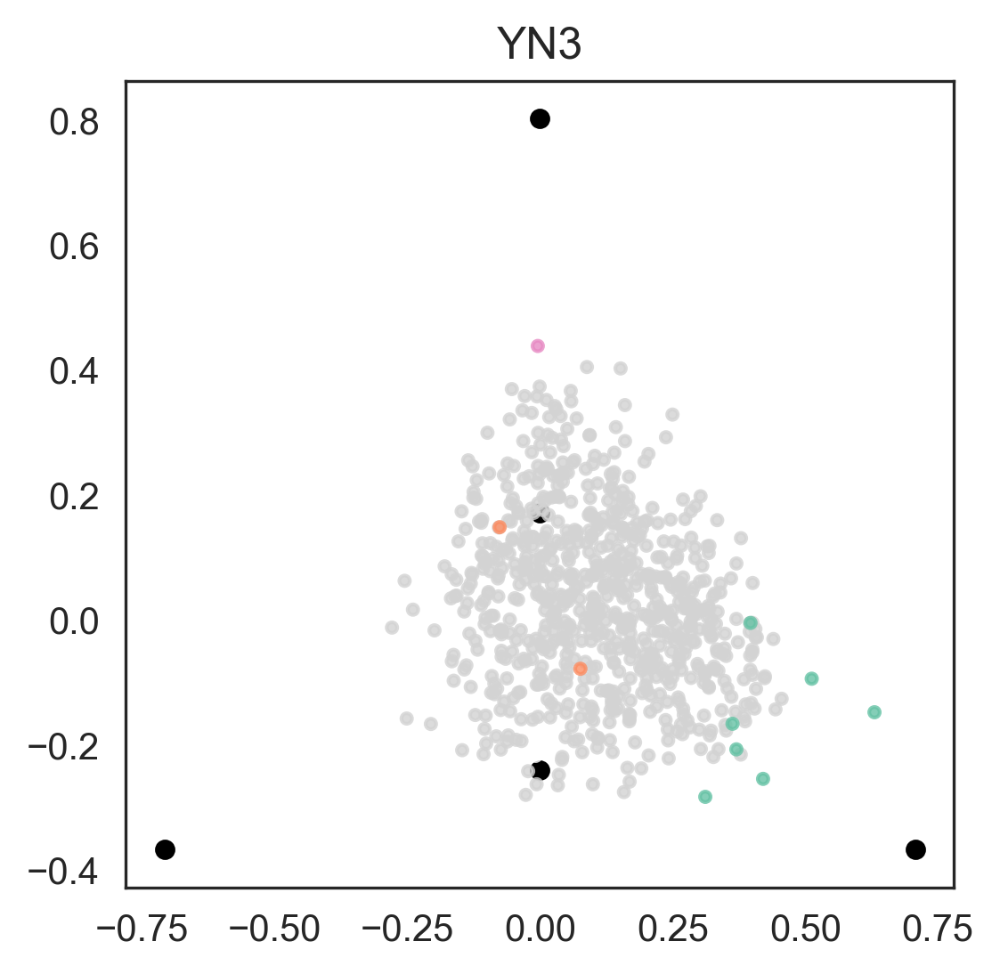

YN5
Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-N_Score'], dtype='object')


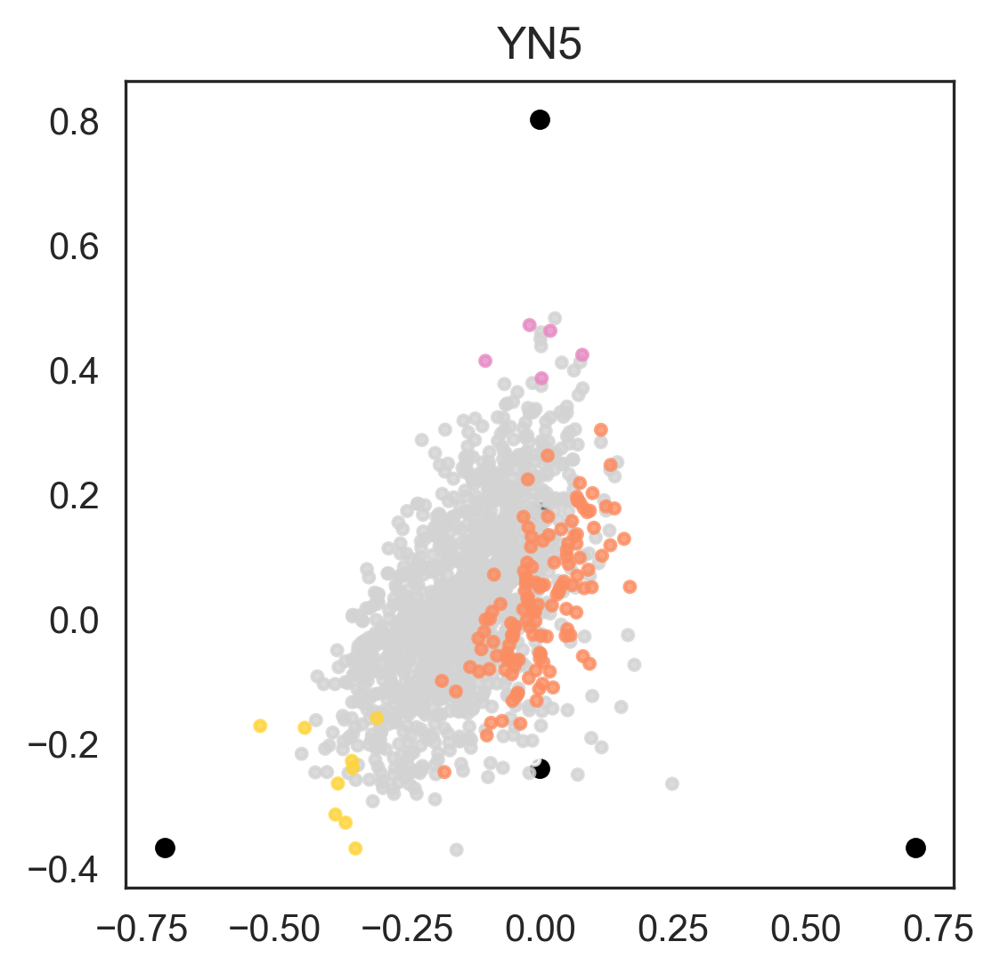

YN6
Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-N_Score'], dtype='object')


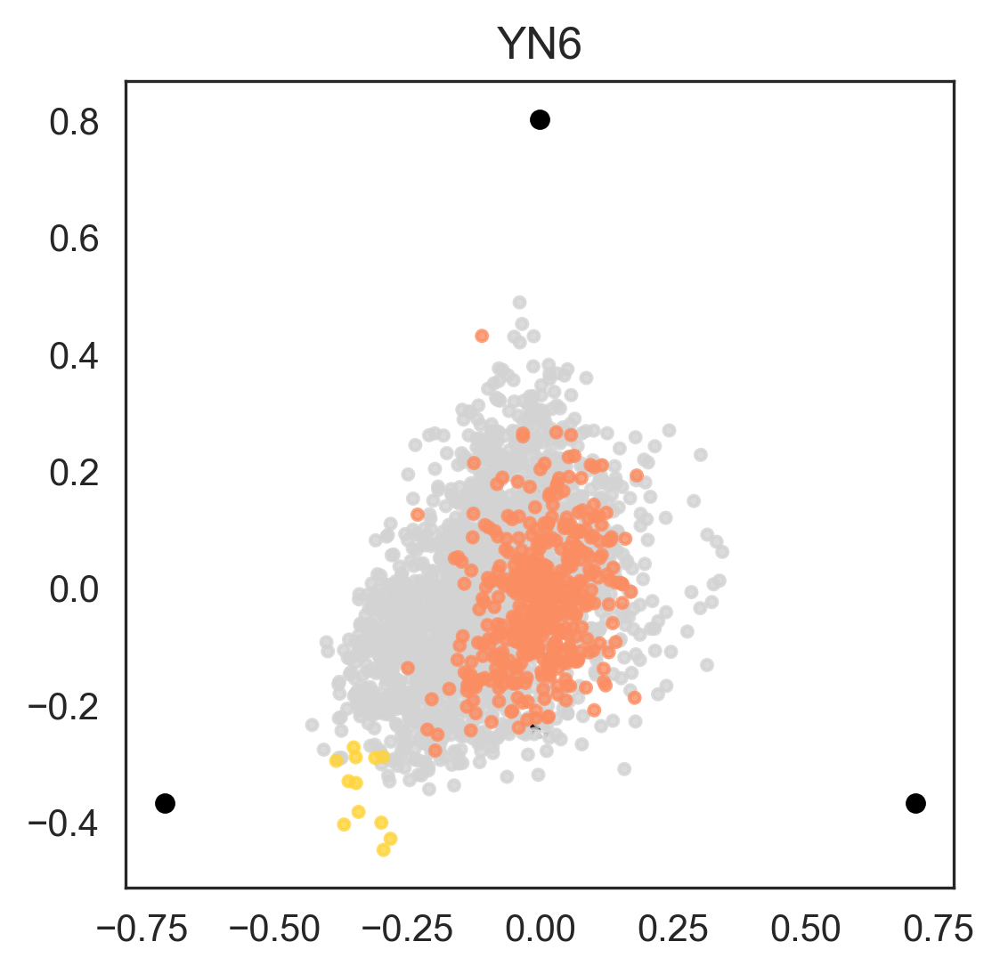

YN7
Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-N_Score'], dtype='object')


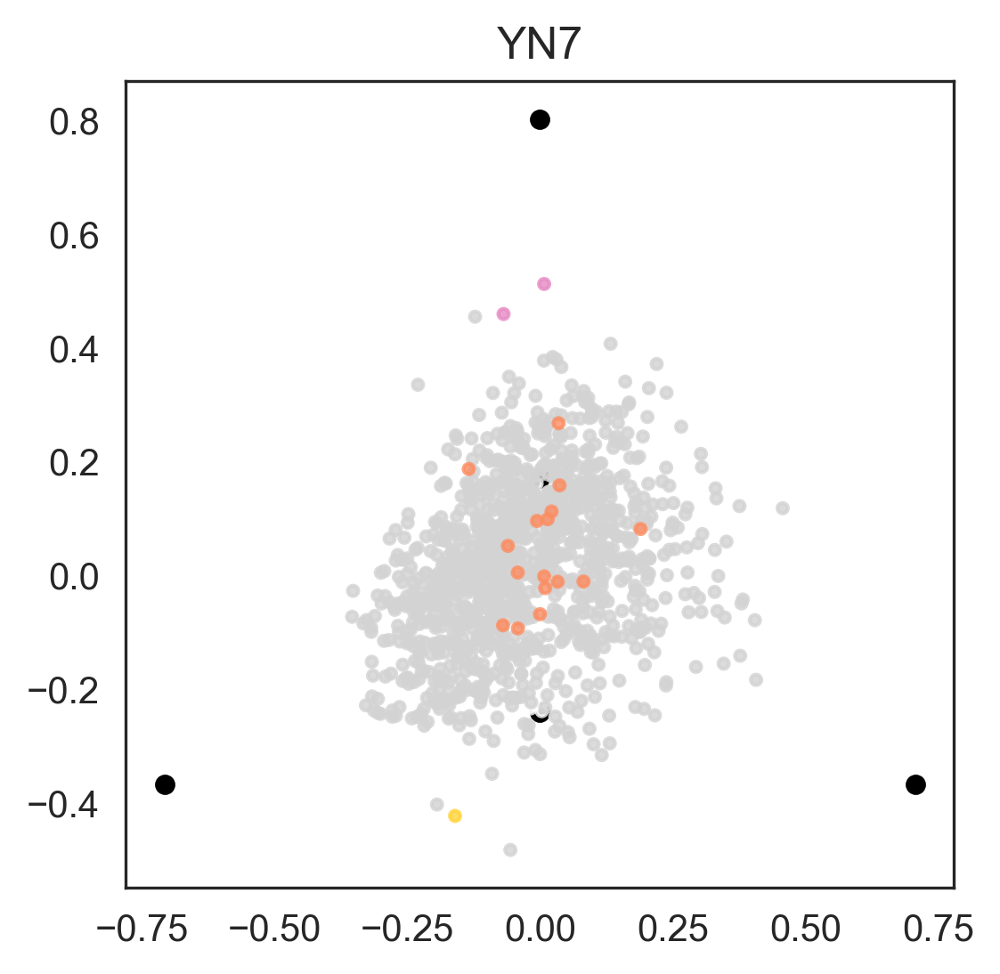

YN8
Index(['SCLC-Y_Score', 'SCLC-A_Score', 'SCLC-A2_Score'], dtype='object')


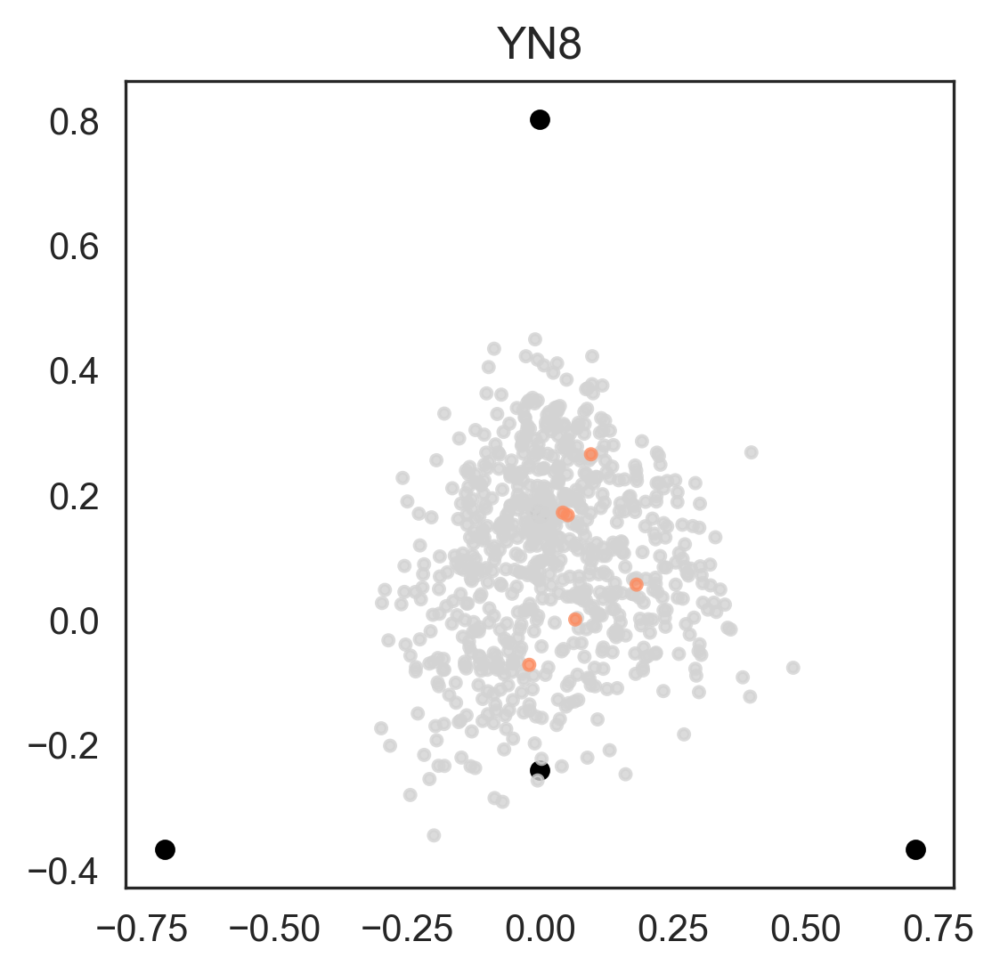

YN9
Index(['SCLC-A2_Score', 'SCLC-P_Score', 'SCLC-N_Score'], dtype='object')


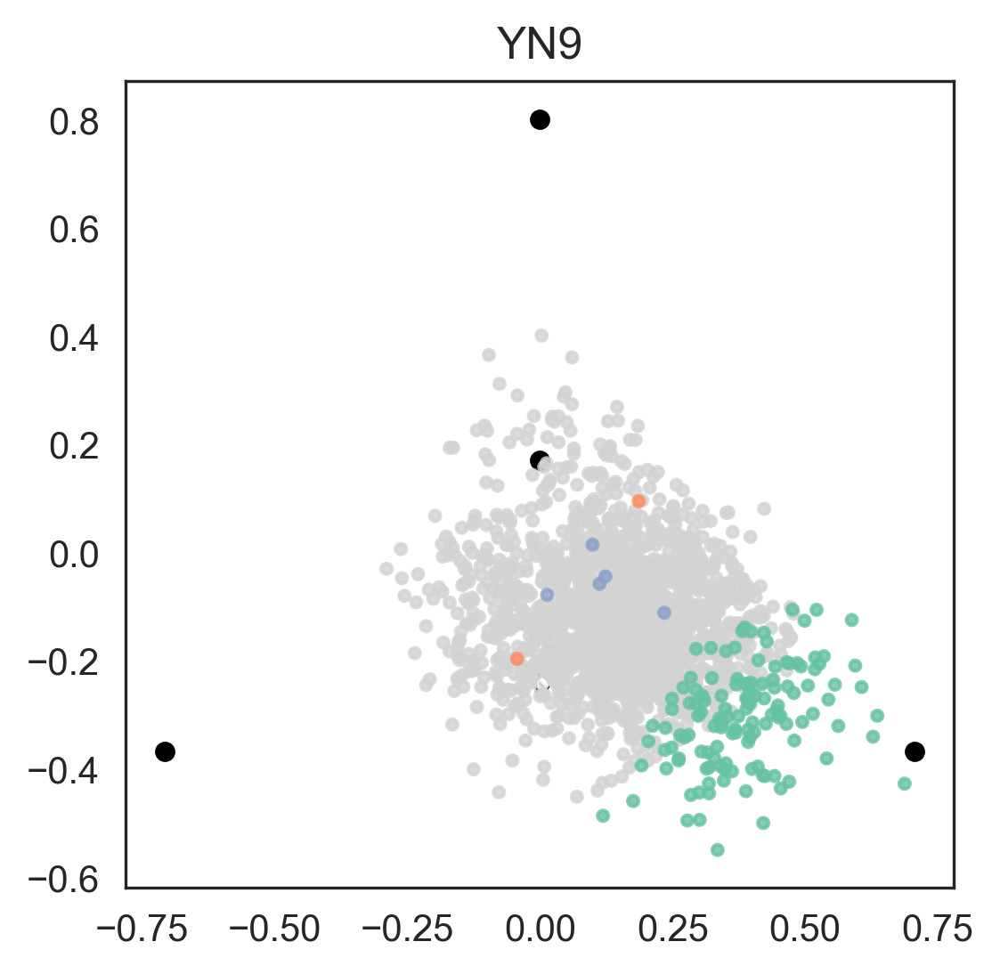

YN11
Index(['SCLC-A_Score', 'SCLC-N_Score', 'SCLC-Y_Score'], dtype='object')


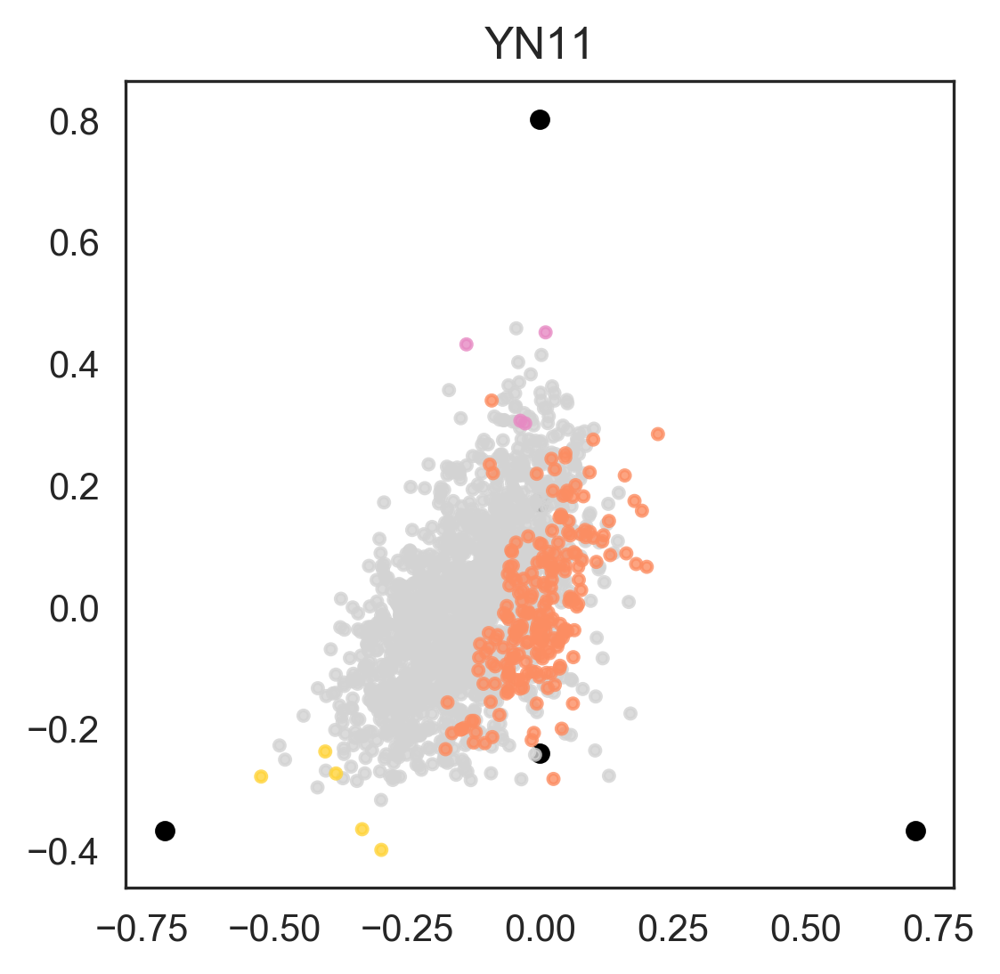

YN12
Index(['SCLC-A2_Score', 'SCLC-Y_Score', 'SCLC-N_Score'], dtype='object')


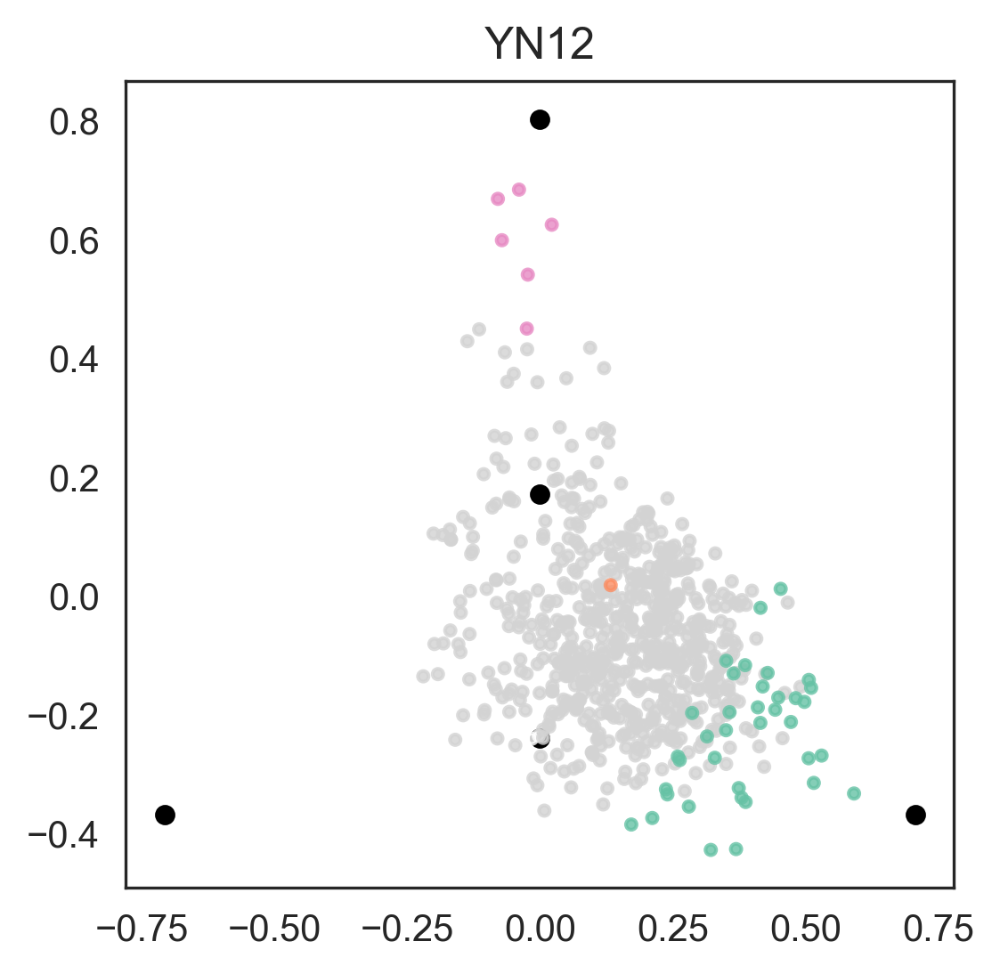

YN13
Index(['SCLC-A2_Score', 'SCLC-Y_Score', 'SCLC-P_Score'], dtype='object')


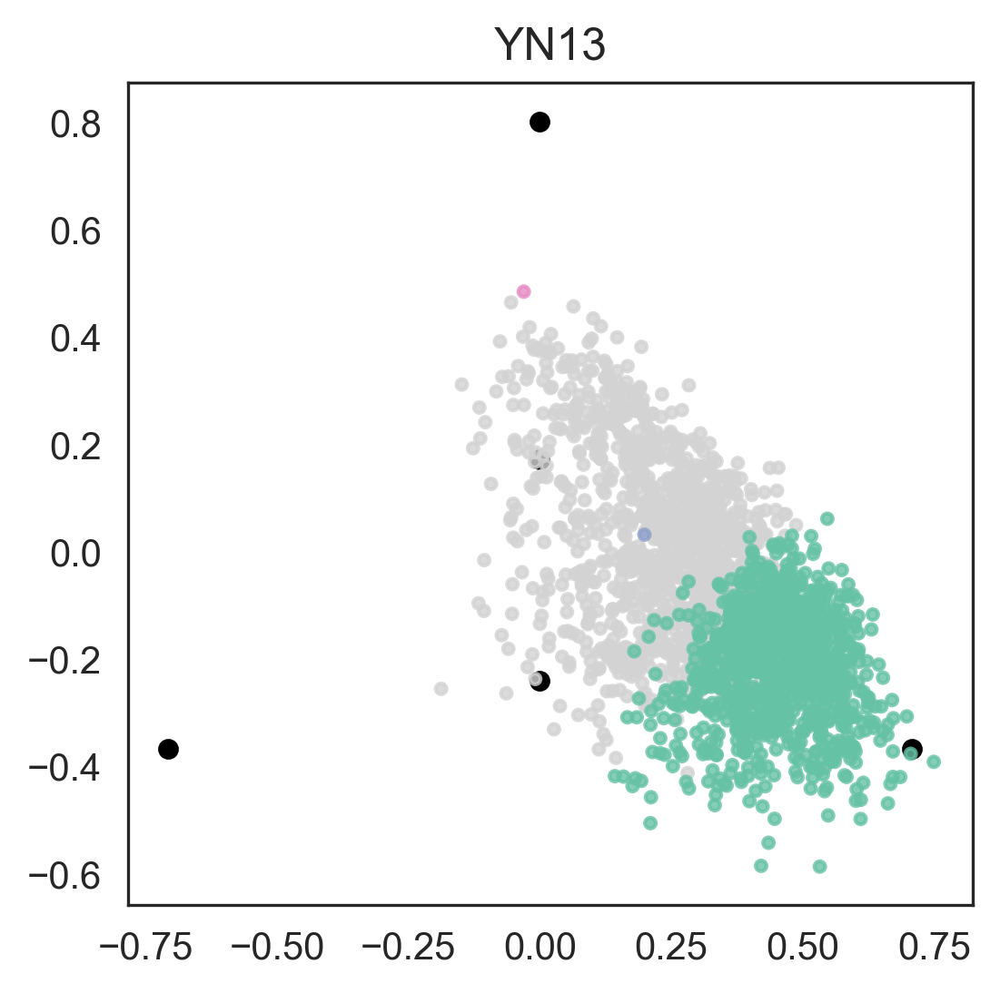

In [31]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'lightgrey', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumor',color = 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',sizes = 20,
                        figsize=(4,4), score_name = '_Score', alpha = .8, s = 8, arrows = False)



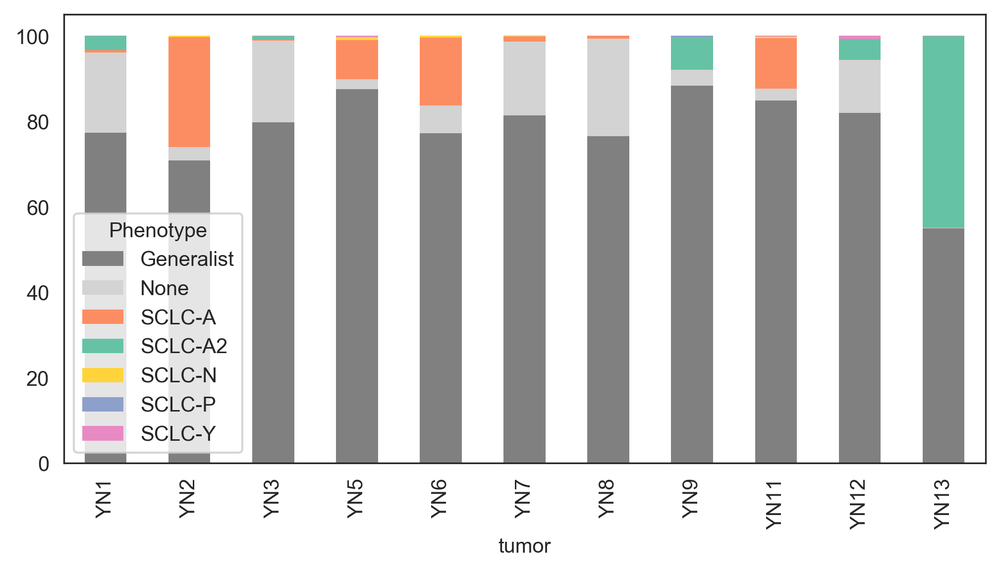

In [32]:
mb.pl.subtype_bar(adata_small,groupby='tumor', fname = 'allograft', pheno_name="Phenotype")


(<matplotlib.axes._subplots.AxesSubplot at 0x7fef22f4f610>,
  <statannot.StatResult.StatResult at 0x7fef556e3910>])

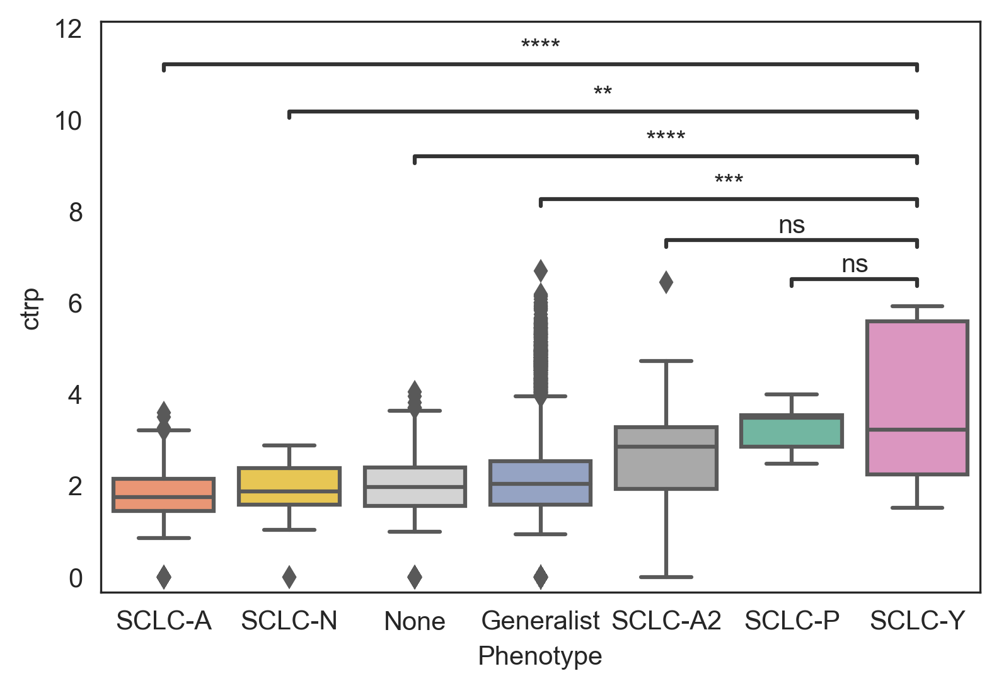

In [33]:
from statannot import add_stat_annotation
cp = ['#a9a9a9','#d3d3d3','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
df = adata_small.obs[['Phenotype','ctrp']].pivot(columns='Phenotype')
df.columns = df.columns.droplevel(0)
sorted_index = df.mean().sort_values().index
plt.figure(figsize=(6,4))
ax = sns.boxplot(data = adata_small.obs, x='Phenotype',y = 'ctrp',palette=[cp[2],cp[4],cp[1],cp[5],cp[0],cp[3],cp[6]],
                order = sorted_index)
add_stat_annotation(ax, data=adata_small.obs, x='Phenotype',y = 'ctrp',
                    order = sorted_index,
                    box_pairs=[('SCLC-Y','None'),
                              ('SCLC-Y','SCLC-A'), ("SCLC-Y", "SCLC-A2"),
                               ("SCLC-Y", "SCLC-N"),("SCLC-Y", "SCLC-P"),
                              ("Generalist", "SCLC-Y")],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
# plt.savefig('./figures/ctrp_tko_phenotype.pdf')


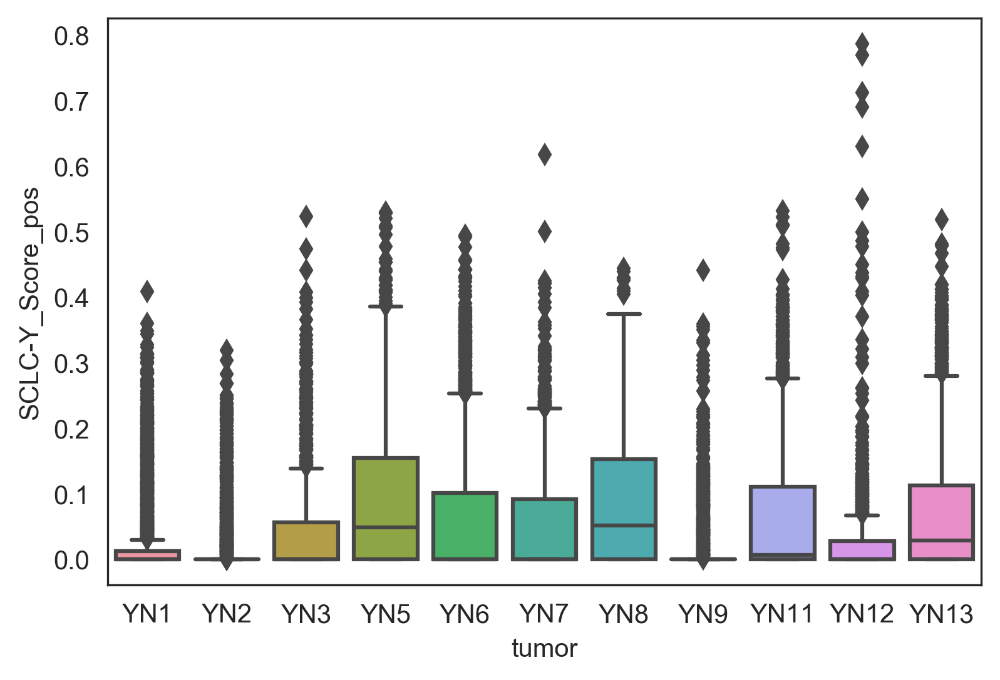

In [39]:
from statannot import add_stat_annotation
cp = ['#a9a9a9','#d3d3d3','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
df = adata_small.obs[['Phenotype','ctrp']].pivot(columns='Phenotype')
df.columns = df.columns.droplevel(0)
sorted_index = df.mean().sort_values().index
plt.figure(figsize=(6,4))
adata_small.obs['SCLC-Y_Score_pos'] = adata_small.obs['SCLC-Y_Score']*(adata_small.obs['SCLC-Y_Score']>0)
ax = sns.boxplot(data = adata_small.obs, x='tumor',y = 'SCLC-Y_Score_pos')
# add_stat_annotation(ax, data=adata_small.obs, x='Phenotype',y = 'ctrp',
#                     order = sorted_index,
#                     box_pairs=[('SCLC-Y','None'),
#                               ('SCLC-Y','SCLC-A'), ("SCLC-Y", "SCLC-A2"),
#                                ("SCLC-Y", "SCLC-N"),("SCLC-Y", "SCLC-P"),
#                               ("Generalist", "SCLC-Y")],
#                     test='Mann-Whitney', text_format='star', loc='inside', verbose=0)

Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-P_Score'], dtype='object')


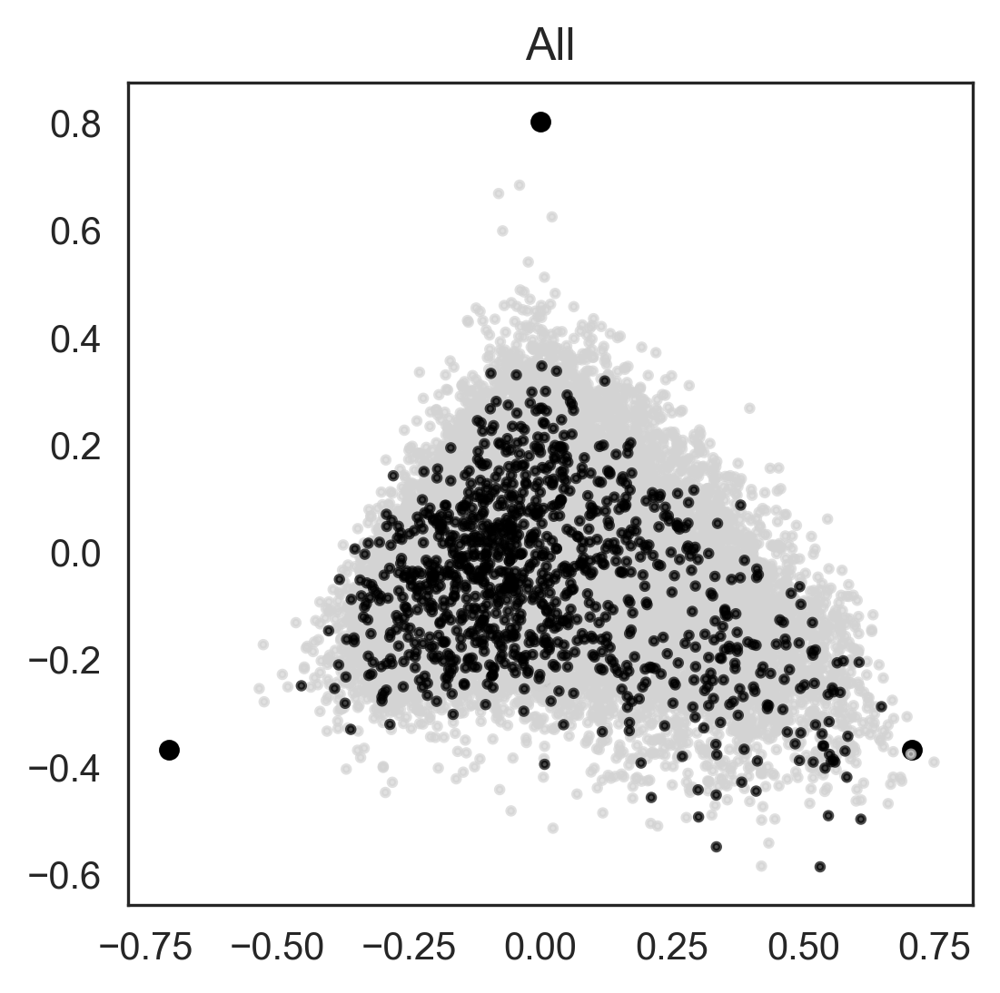

In [34]:
 import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
# color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
#               'Generalist': 'darkgray', 'None': 'lightgrey'}
color_dict = {'True':'black','False':'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='absorbing',grid = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,cmap = 'Reds',
                        multiplier=1, figsize=(4,4), score_name = '_Score', alpha = .7, s = 4, sizes = 20)



In [35]:
adata.obs['Phenotype'] = adata_small.obs['Phenotype']
adata.write_h5ad('../int/allografts/adata06.h5ad')


# Network inference: Imputation of time points

In [57]:
mb.pp.magic_recipe(adata, [i.capitalize() for i in tfs], 'Phenotype_filtered', fname='rpm')


Calculating MAGIC...
  Running MAGIC on 15257 cells and 21163 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 10.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 33.19 seconds.
    Calculating affinities...
    Calculated affinities in 31.84 seconds.
  Calculated graph and diffusion operator in 76.00 seconds.
  Calculating imputation...
  Calculated imputation in 0.08 seconds.
Calculated MAGIC in 83.04 seconds.
Calculating PCA...
Calculated PCA in 9.02 seconds.
Calculating imputation...
Calculated imputation in 0.08 seconds.


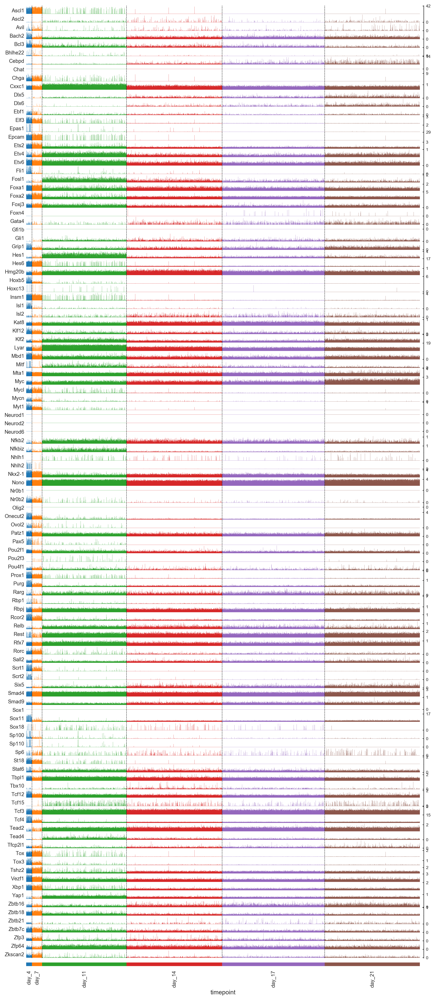

In [17]:
sc.pl.tracksplot(adata, var_names=sorted(list(set([i.capitalize() for i in tfs]).intersection(set(adata.var_names)))),
                 groupby='timepoint', layer = 'Ms')

In [8]:
mb.network.moments_recipe(adata, fname='rpm_nomagic', genes = [i.capitalize() for i in tfs], clusters='Phenotype_filtered')

Let's save the data at this point.

In [15]:
mb.pp.doublet_detections(adata,layer='matrix')
adata_small.obs['doublet_scores'] = adata.obs['doublet_scores']
adata_small.obs['predicted_doublets'] = adata.obs['predicted_doublets']

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.46
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 31.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 4.4%
Elapsed time: 11.7 seconds


Index(['SCLC-A_Score', 'SCLC-Y_Score', 'SCLC-A2_Score'], dtype='object')


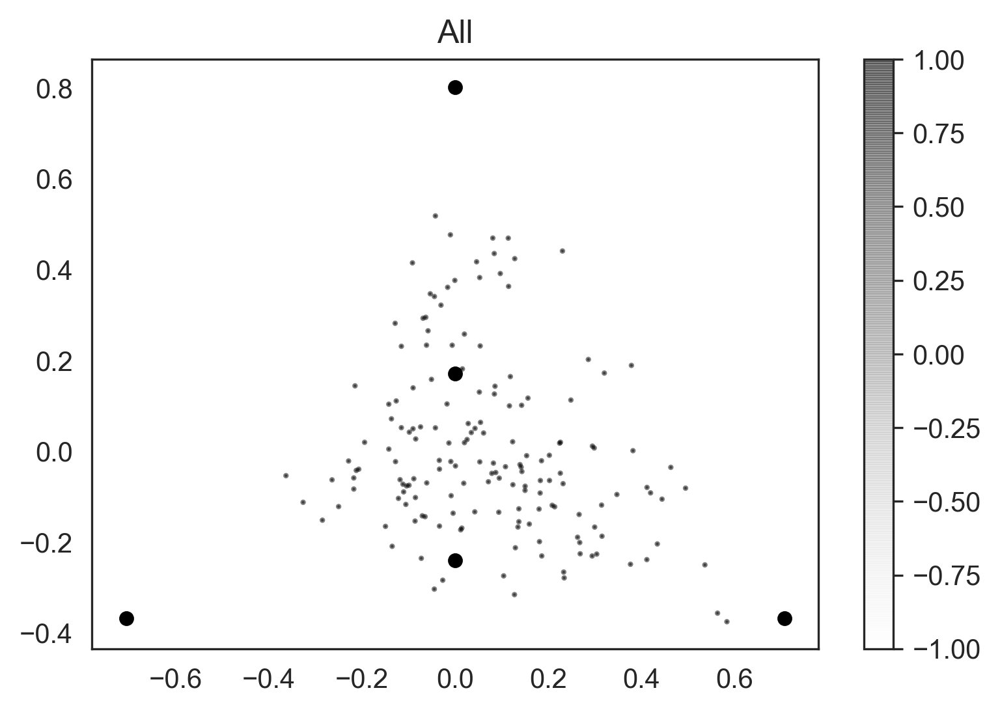

In [16]:

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small[adata_small.obs['predicted_doublets'] == True], sig_matrix, color_dict=color_dict, groupby='None',color='predicted_doublets',grid = False,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,cmap = 'Greys',
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .5, s = 1, sizes = 20)



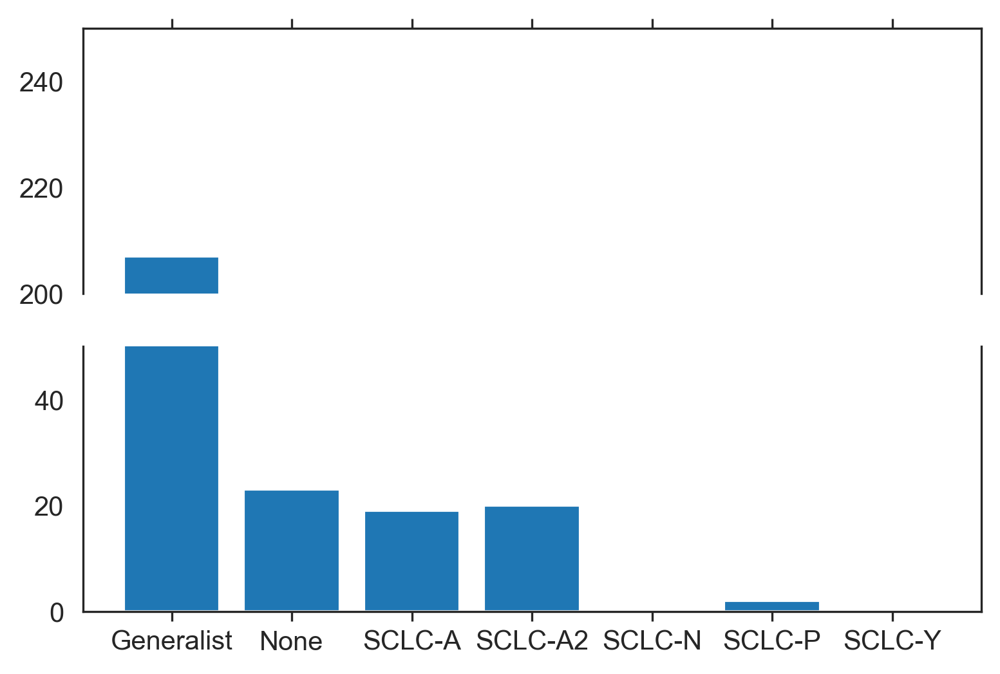

In [51]:
f, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize = (6,4))

# plot the same data on both axes
ax.bar(pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing']).index, 
       pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing'])['True'])
ax2.bar(pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing']).index, 
       pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing'])['True'])
# zoom-in / limit the view to different portions of the data
ax.set_ylim(200, 250)  # outliers only
ax2.set_ylim(0, 50)  # most of the data

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.xaxis.tick_top()
ax.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()
plt.savefig('./figures/absorbing_tkos.pdf')

In [52]:
cp_all = ['#a9a9a9','#d3d3d3','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']


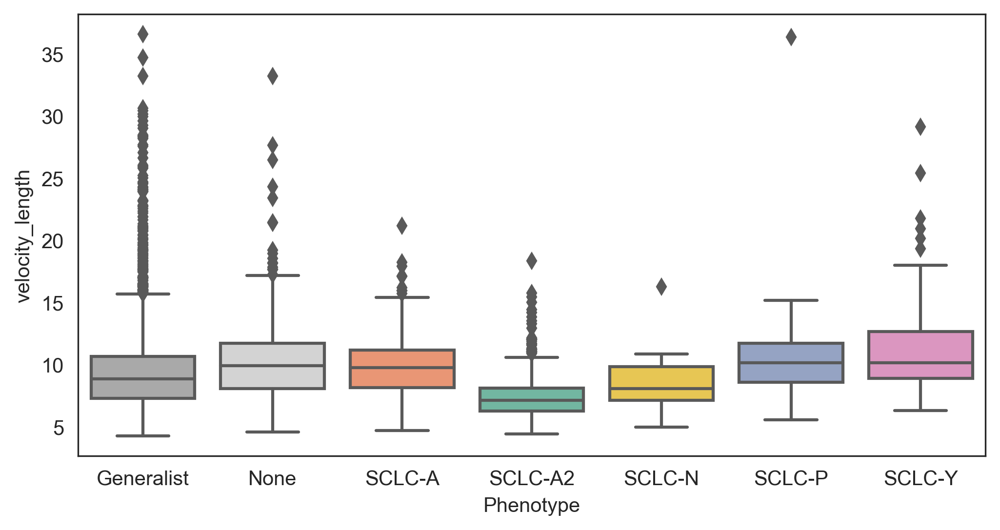

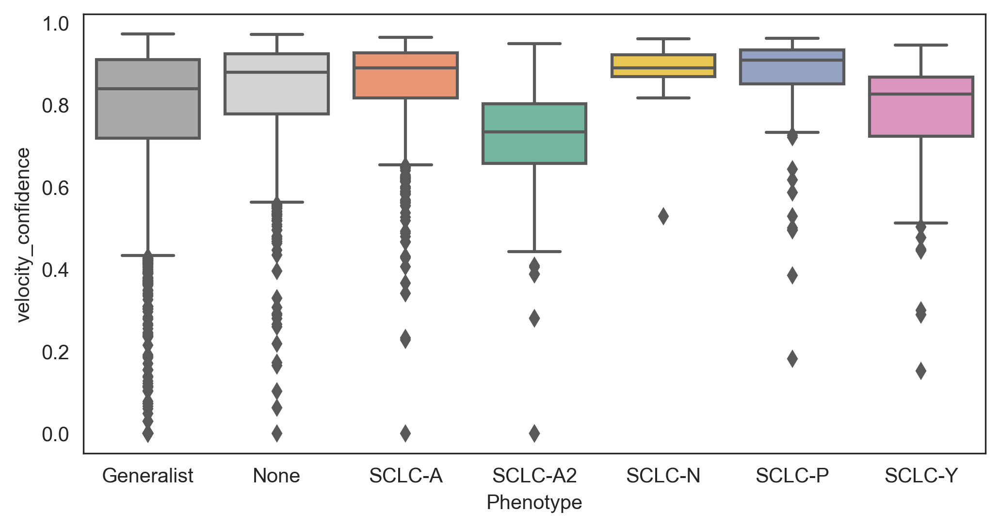

In [54]:
sns.boxplot(adata_small.obs['Phenotype'], adata_small.obs['velocity_length'], palette = cp_all,
                      order = sorted(set(adata_small.obs['Phenotype'])))
plt.figure()
sns.boxplot(adata_small.obs['Phenotype'], adata_small.obs['velocity_confidence'], palette = cp_all,
                       order = sorted(set(adata_small.obs['Phenotype'])))


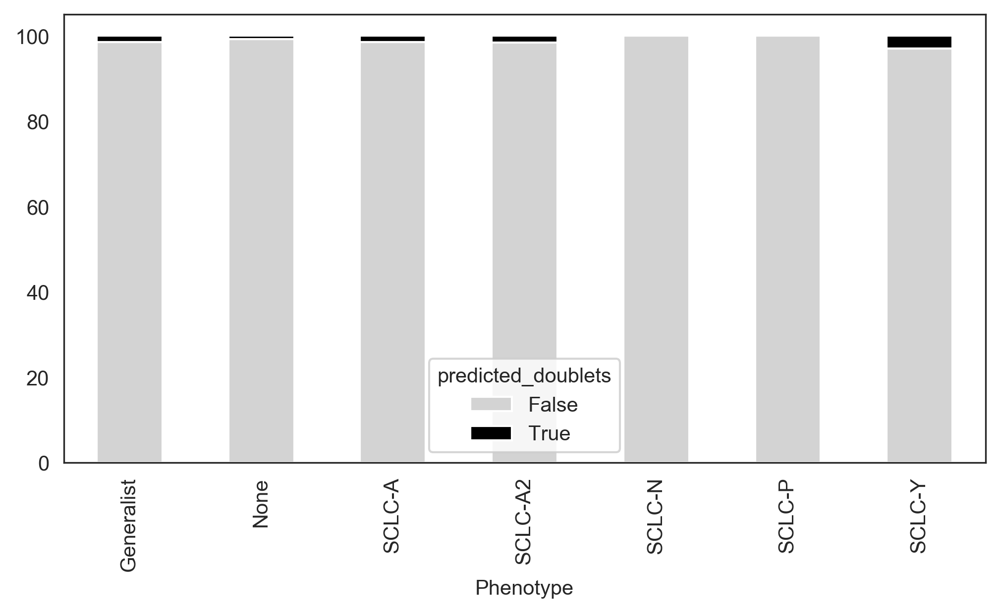

In [49]:

plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype'])/
  pd.crosstab(adata_small.obs['predicted_doublets'], adata_small.obs['Phenotype']).sum(axis = 0))*100).T.plot.bar(stacked = True,color = ['#d3d3d3','black'])
plt.savefig('./figures/tko_doublets.pdf')